# Advanced Lane Finding Project

The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Apply a perspective transform to rectify binary image ("birds-eye view").
4. Use color transforms, gradients, etc., to create a thresholded binary image.
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

## Compute camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline  

In [2]:
def get_calibration_points(images, nx, ny):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
    
    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.
    chessboard_corners = []
    
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
        chessboard_corners.append((ret, corners))
    return chessboard_corners, objpoints, imgpoints


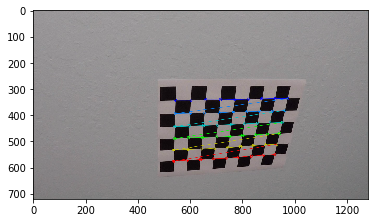

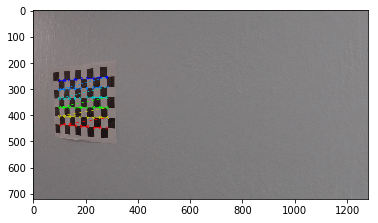

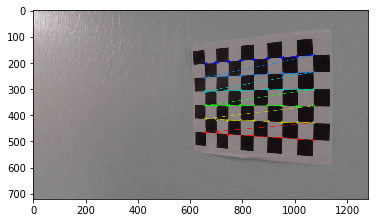

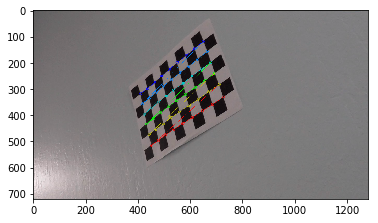

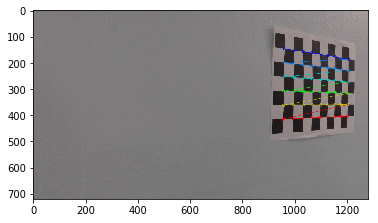

...

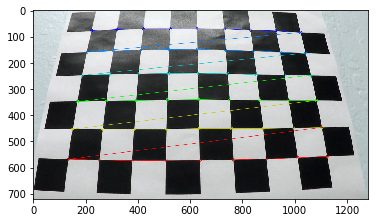

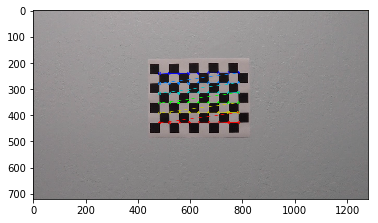

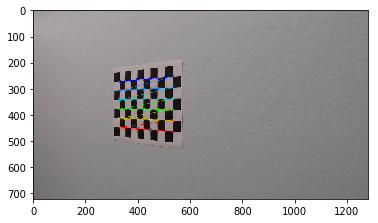

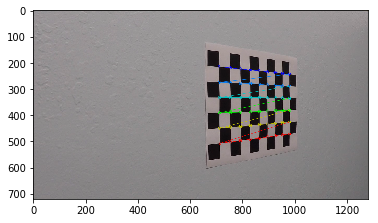

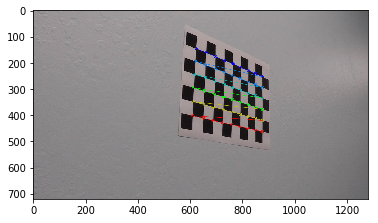

In [3]:
# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
chessboard_corners, objpoints, imgpoints = get_calibration_points(images, 9,6)

# Step through the list and search for chessboard corners
for fname, (ret, corners) in zip(images, chessboard_corners):
    img = cv2.imread(fname)

    if ret == True:
        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        plt.figure()
        plt.imshow(img)

In [4]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[:-1], None, None)  # Delete this line

## Apply a distortion correction to raw images

In [5]:
def undistort(img):
    # Use cv2.calibrateCamera() and cv2.undistort()
    return cv2.undistort(img, mtx, dist, None, mtx)

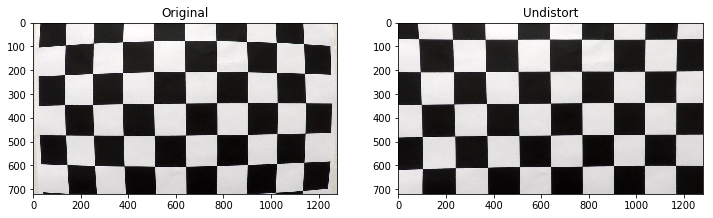

In [6]:
plt.figure(figsize=(12,12))
plt.subplot(1, 2, 1)
plt.imshow(plt.imread('./camera_cal/calibration1.jpg'))
plt.title("Original")
plt.subplot(1, 2, 2)
plt.imshow(undistort(plt.imread('./camera_cal/calibration1.jpg')))
plt.title("Undistort")

## Birds-eye view

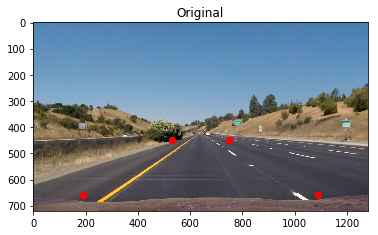

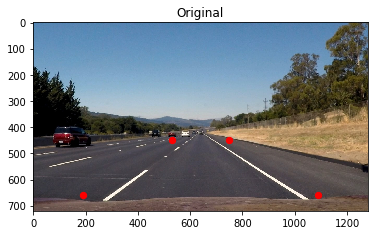

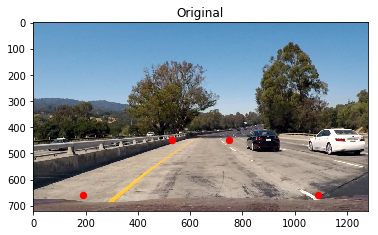

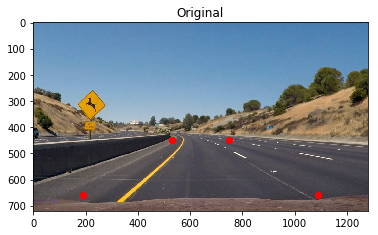

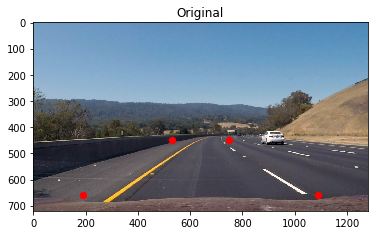

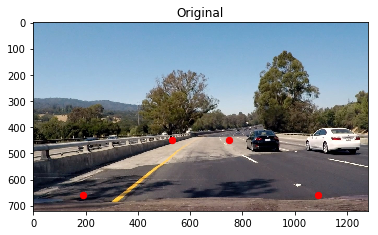

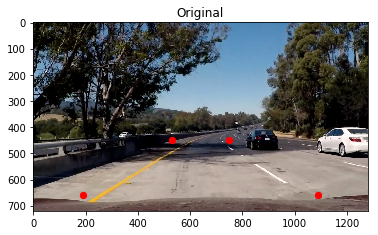

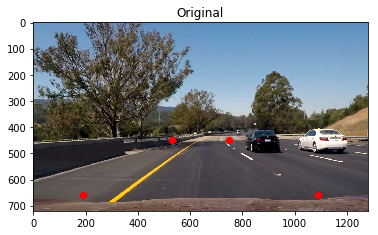

In [7]:
images = glob.glob('./test_images/*.jpg')
for image_file in images:
    img = plt.imread(image_file)
    plt.figure()
    undist = undistort(img)
    shape = undist.shape
    plt.imshow(img)
    plt.scatter(x=[530, shape[1] - 530, 190, shape[1] - 190], y=[450, 450, 660, 660], c='r', s=40)
    plt.title("Original")

In [8]:
src = np.float32([[530, 450], [190, 660], [shape[1] - 190, 660], [shape[1] - 530, 450]])
offset = 50
dst = np.float32([[offset, offset],
       [offset, shape[0] - offset],
       [shape[1] - offset, shape[0] - offset],
       [shape[1] - offset, offset]])
M = cv2.getPerspectiveTransform(src, dst)
M_inverse = cv2.getPerspectiveTransform(dst, src)

def birds_eye_view(img):
    return cv2.warpPerspective(img, M, (img.shape[1], img.shape[0]))

def inverse_birds_eye_view(img):
    return cv2.warpPerspective(img, M_inverse, (img.shape[1], img.shape[0]))

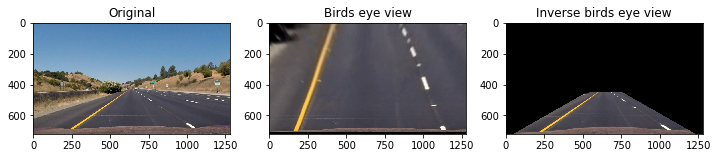

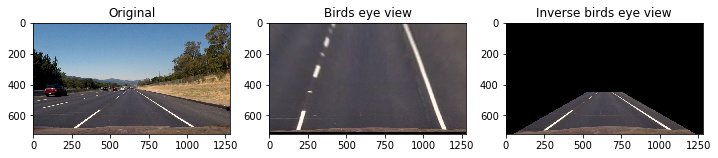

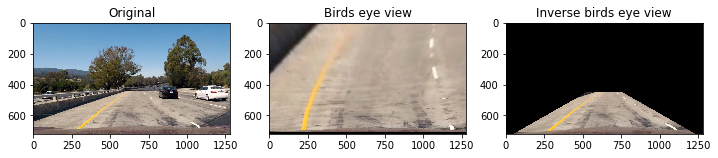

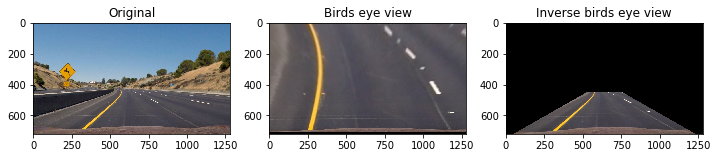

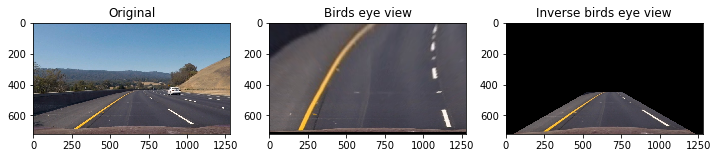

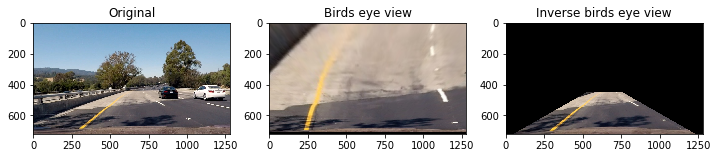

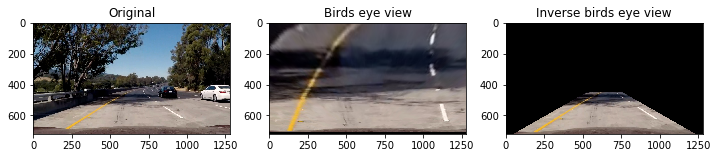

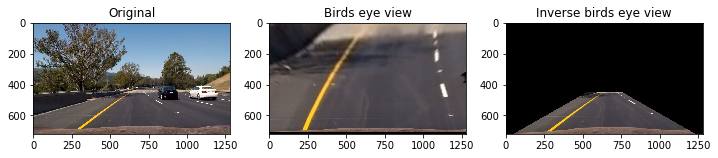

In [9]:
images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = plt.imread(fname)
    plt.figure(figsize=(12, 12))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Original")
    undist = undistort(img)
    imgb = birds_eye_view(undist)
    plt.subplot(1, 3, 2)
    plt.imshow(imgb)
    plt.title("Birds eye view")
    imgb = inverse_birds_eye_view(imgb)
    plt.subplot(1, 3, 3)
    plt.imshow(imgb)
    plt.title("Inverse birds eye view")

## Use color transforms, gradients, etc., to create a thresholded binary image.

In [10]:
def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def binary_image(img, space, channel):
    color_t = getattr(cv2, 'COLOR_RGB2{}'.format(space))
    gray = cv2.cvtColor(img, color_t)[:, :, channel]
    gray = gaussian_blur(gray, 5)
    return gray

/Users/josebermeo/miniconda2/envs/carnd-term1/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


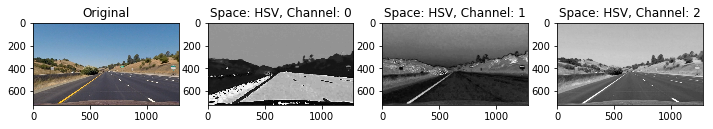

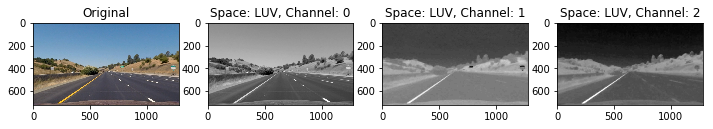

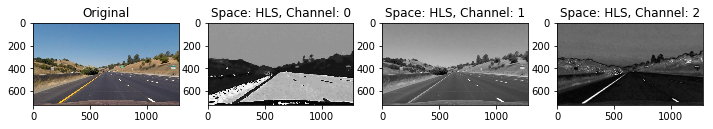

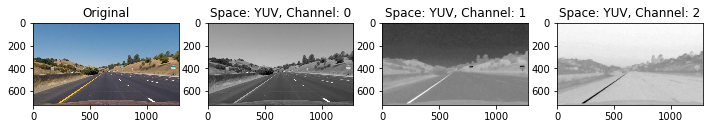

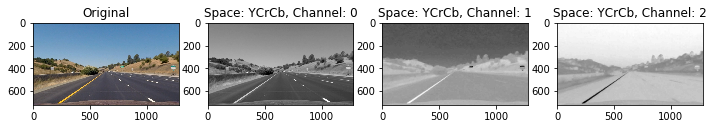

...

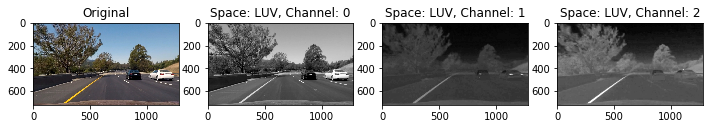

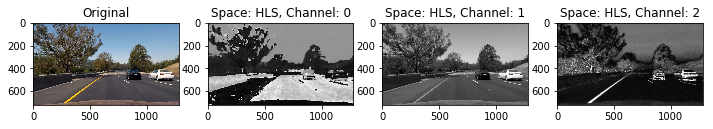

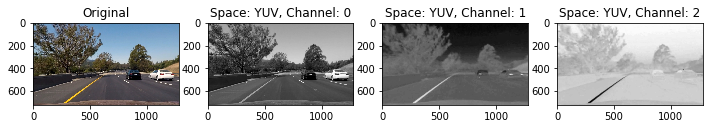

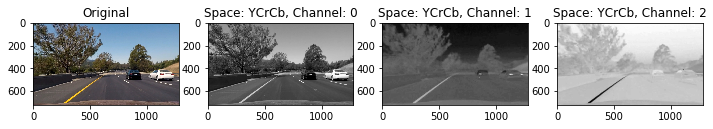

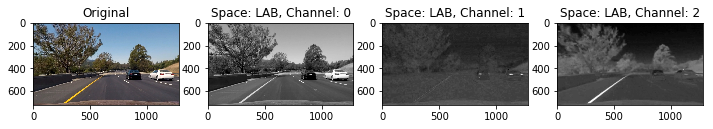

In [11]:
color_spaces = ['HSV', 'LUV', 'HLS', 'YUV', 'YCrCb', 'LAB']
images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = plt.imread(fname)
    img = undistort(img)
    for color_space in color_spaces:
        plt.figure(figsize=(12, 12))
        plt.subplot(1, 4, 1)
        plt.imshow(img)
        plt.title("Original")
        for channel in range(3):
            gray = binary_image(img, color_space, channel)
            plt.subplot(1, 4, channel + 2)
            plt.imshow(gray, cmap='gray')
            plt.title("Space: {}, Channel: {}".format(color_space, str(channel)))

In [12]:
def binary_image(img, space, channel, threshold_min, threshold_max):
    color_t = getattr(cv2, 'COLOR_RGB2{}'.format(space))
    gray = cv2.cvtColor(img, color_t)[:, :, channel]
    gray = gaussian_blur(gray, 5)
    binary = np.zeros_like(gray)
    binary[(gray >= threshold_min) & (gray < threshold_max)] = 1
    return binary

### Space: HLS channel S

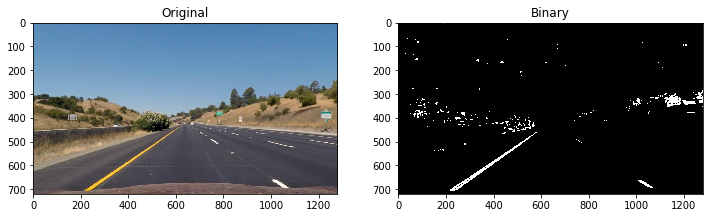

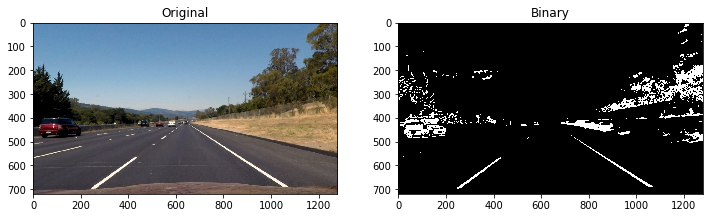

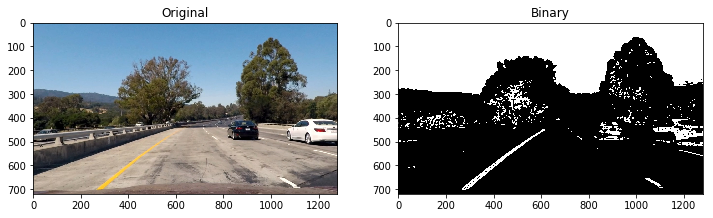

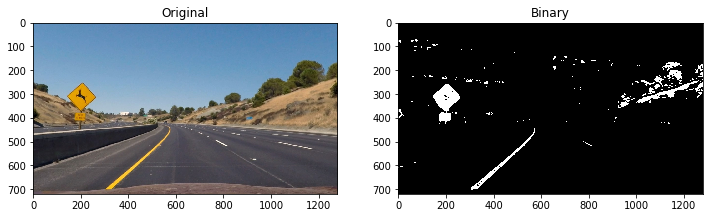

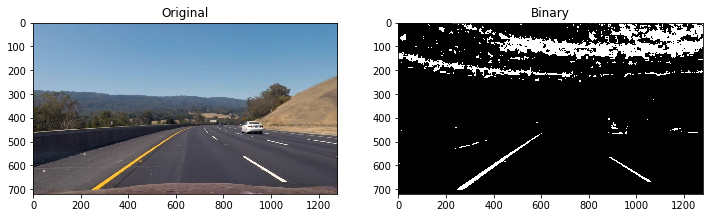

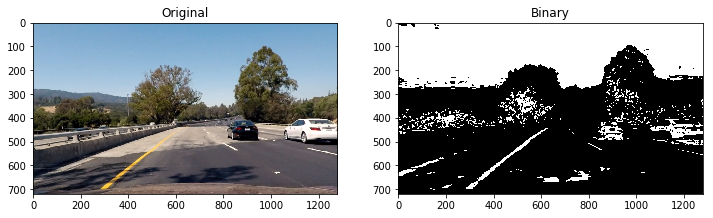

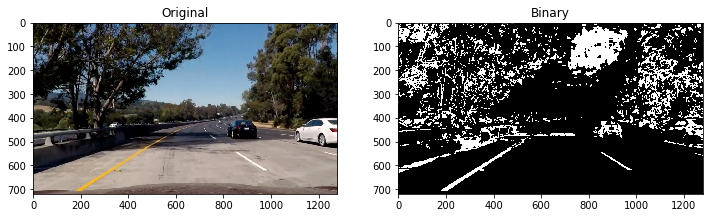

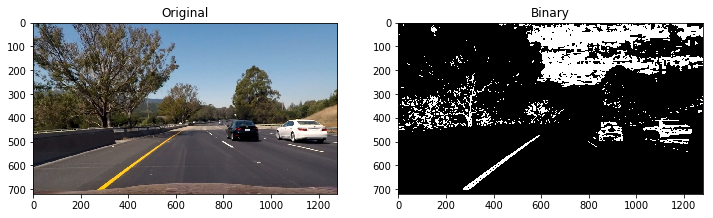

In [13]:
images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = plt.imread(fname)
    img = undistort(img)
    gray = binary_image(img, 'HLS', 2, 110, 255)
    plt.figure(figsize=(12,12))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original")
    plt.subplot(1, 2, 2)
    plt.imshow(gray * 255, cmap='gray')
    plt.title("Binary")

# Gradient

In [14]:
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(img, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    return binary_output

def mag_thresh(gray, thresh_min=0, thresh_max = 255):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)

    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)

    binary_output = np.zeros_like(gradmag)

    binary_output[(gradmag >= thresh_min) & (gradmag <= thresh_max)] = 1

    return binary_output

def dir_threshold(gray, thresh_min=0, thresh_max=np.pi / 2, ksize=7):
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize)

    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))

    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh_min) & (absgraddir <= thresh_max)] = 1

    return binary_output

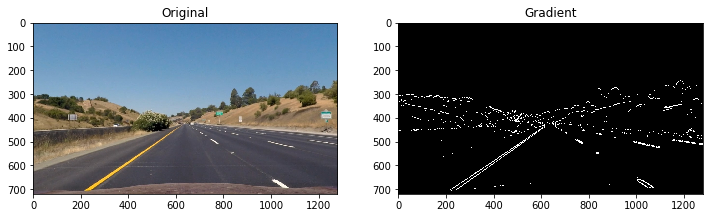

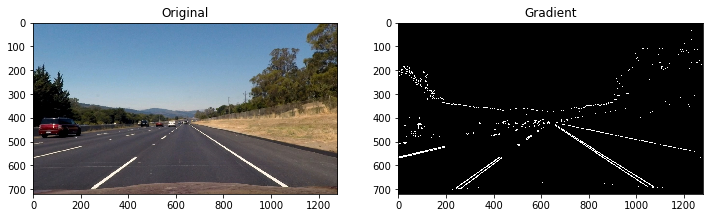

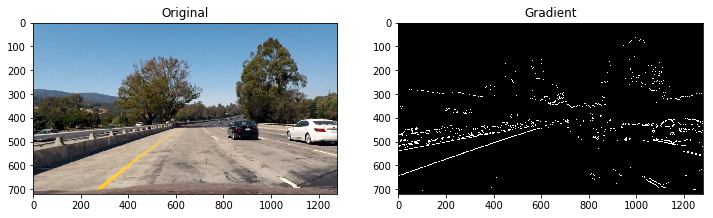

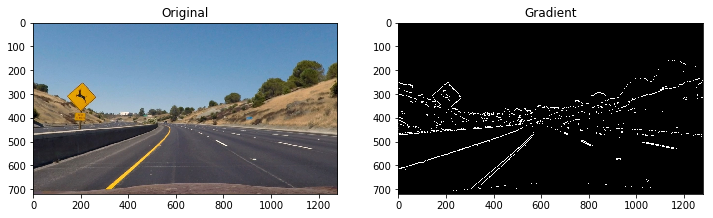

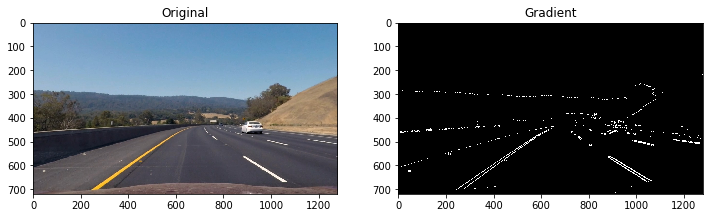

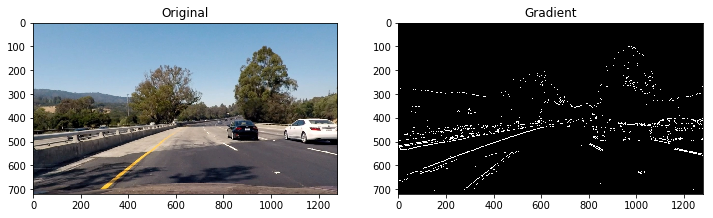

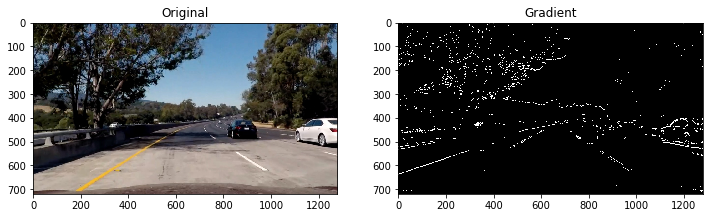

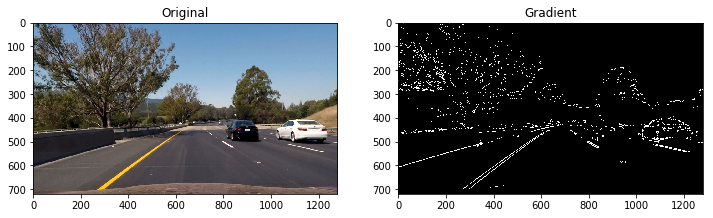

In [15]:
images = glob.glob('./test_images/*.jpg')
for fname in images:
    img = plt.imread(fname)
    img = undistort(img)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)[:, :, 0]
    gray = gaussian_blur(gray, 5)
    
    gradx = abs_sobel_thresh(gray, orient='x', thresh_min=10, thresh_max=255)
    grady = abs_sobel_thresh(gray, orient='y', thresh_min=60, thresh_max=255)
    mag_binary = mag_thresh(gray, thresh_min=60, thresh_max=255)
    dir_binary = dir_threshold(gray, thresh_min=.65, thresh_max= 1.05)

    combined = np.zeros_like(gray)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1

    plt.figure(figsize=(12,12))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original")
    plt.subplot(1, 2, 2)
    plt.imshow(combined * 255, cmap='gray')
    plt.title("Gradient")

In [16]:
def binary_image(img):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:, :, 2]
    gray = gaussian_blur(gray, 5)
    
    binary_color = np.zeros_like(gray)
    binary_color[(gray >= 110) & (gray <= 255)] = 1
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)[:, :, 0]
    gray = gaussian_blur(gray, 5)
    
    gradx = abs_sobel_thresh(gray, orient='x', thresh_min=10, thresh_max=255)
    grady = abs_sobel_thresh(gray, orient='y', thresh_min=60, thresh_max=255)
    mag_binary = mag_thresh(gray, thresh_min=60, thresh_max=255)
    dir_binary = dir_threshold(gray, thresh_min=.65, thresh_max= 1.05)

    binary_grad = np.zeros_like(gray)
    binary_grad[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    
    color_binary = np.zeros_like(binary_color)
    color_binary[(binary_color > 0) | (binary_grad > 0)] = 1

    return color_binary

## Detect lane pixels and fit to find the lane boundary.

In [17]:
def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = []
    window = np.ones(window_width)
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_window = image[int(3 * image.shape[0] // 4):, : int(image.shape[1] // 2)]
    l_sum = np.sum(l_window, axis=0)
    l_conv = np.convolve(window, l_sum)
    if np.sum(l_sum) > 0:
        l_center = np.average(range(len(l_conv)), weights=l_conv) - window_width / 2
        l_center = int(np.round(l_center))
    else:
        # No pixels on the image, set a initial guess
        l_center = 250
    r_window = image[int(3 * image.shape[0] // 4):, int(image.shape[1] // 2):]
    r_sum = np.sum(r_window, axis=0)
    r_conv = np.convolve(window, r_sum)
    if np.sum(r_sum) > 0:
        r_center = np.average(range(len(r_conv)), weights=r_conv) - window_width / 2 + image.shape[1] // 2
        r_center = int(np.round(r_center))
    else:
        # No pixels on the image, set a initial guess
        r_center = 1100
    
    # Add what we found for the first layer
    window_centroids.append((image.shape[0], l_center, r_center))
    
    # Go through each layer looking for max pixel locations
    layer_end = image.shape[0] - window_height // 2
    while layer_end > 0:
        # convolve the window into the vertical slice of the image
        layer_start = max(layer_end - window_height, 0)
        layer = image[layer_start : layer_end,:]
        layer_sum = np.sum(layer, axis=0)
        conv_signal = np.convolve(window, layer_sum)

        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width / 2
        l_min_index = int(max(l_center + offset - margin, 0))
        l_max_index = int(min(l_center + offset + margin, image.shape[1]))
        l_conv = conv_signal[l_min_index:l_max_index]
        if np.sum(l_conv) > 0:
            l_center = np.average(range(len(l_conv)), weights=l_conv) + l_min_index - offset
            l_center = int(np.round(l_center))
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center + offset - margin,0))
        r_max_index = int(min(r_center + offset + margin, image.shape[1]))
        r_conv = conv_signal[r_min_index:r_max_index]
        if np.sum(r_conv) > 0:
            r_center = np.average(range(len(r_conv)), weights=r_conv) + r_min_index - offset
            r_center = int(np.round(r_center))
        # Add what we found for that layer
        window_centroids.append((layer_end, l_center, r_center))

        # Move window
        layer_end -= window_height // 2

    return window_centroids

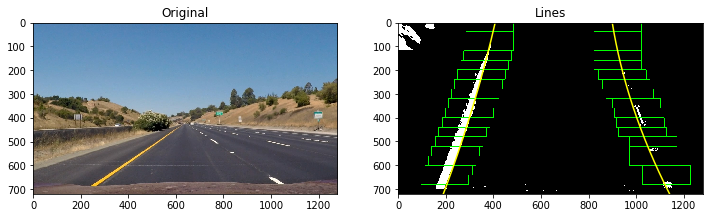

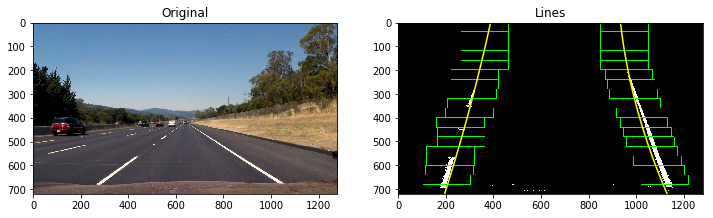

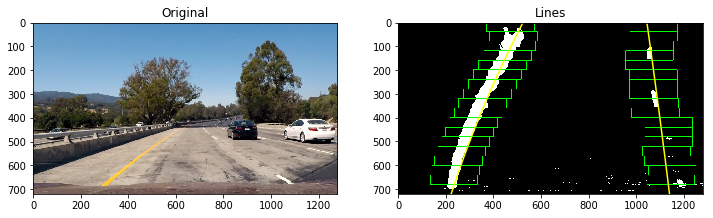

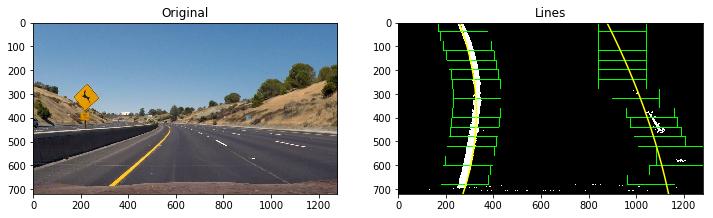

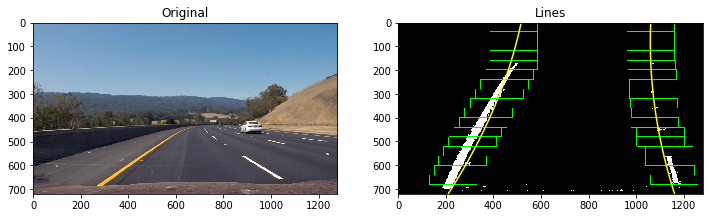

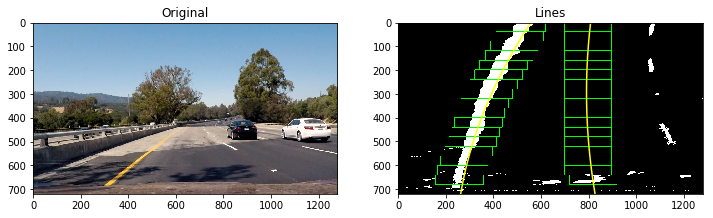

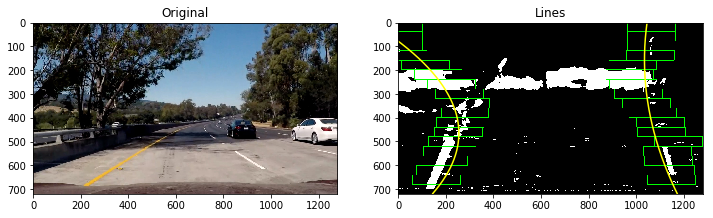

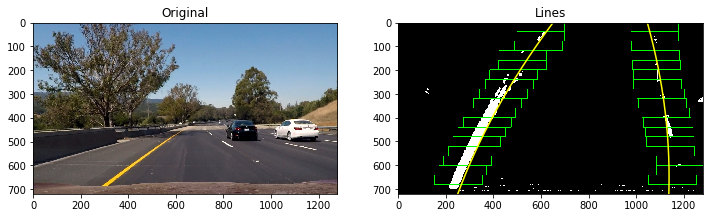

In [18]:
images = glob.glob('./test_images/*.jpg')
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching
for fname in images:
    img = plt.imread(fname)
    plt.figure(figsize=(12,12))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original")
    
    undist = undistort(img)
    birds_eye_view_img = birds_eye_view(undist)
    binary_warped = binary_image(birds_eye_view_img)
    
    window_centroids = find_window_centroids(binary_warped, window_width, window_height, margin)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    for i in range(1, len(window_centroids)): 
        win_xleft_low = window_centroids[i][1] - margin
        win_xleft_high = window_centroids[i][1] + margin
        win_xright_low = window_centroids[i][2] - margin
        win_xright_high = window_centroids[i][2] + margin
        if i + 1 == len(window_centroids):
            win_y_low = 0
        else:
            win_y_low = window_centroids[i + 1][0]
        win_y_high = window_centroids[i][0]
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2)
    
    y = [centroid[0] for centroid in window_centroids]
    leftx = [centroid[1] for centroid in window_centroids]
    rightx = [centroid[2] for centroid in window_centroids]
    left_fit = np.polyfit(y, leftx, 2)
    right_fit = np.polyfit(y, rightx, 2)
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    plt.subplot(1, 2, 2)
    plt.imshow(out_img)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.title("Lines")

In [19]:
def find_lane_line_fits_from_centroids(window_centroids):
    y = [centroid[0] for centroid in window_centroids]
    leftx = [centroid[1] for centroid in window_centroids]
    rightx = [centroid[2] for centroid in window_centroids]
    return np.polyfit(y, leftx, 2), np.polyfit(y, rightx, 2)

In [20]:
def find_lane_line_fits(image, margin, left_fit, right_fit):
    nonzero = image.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    # Generate x and y values for plotting
    if len(leftx) > 0 and len(lefty) > 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) > 0 and len(righty) > 0:
        right_fit = np.polyfit(righty, rightx, 2)
    return left_fit, right_fit

In [21]:
ym_per_pix = 30.0 / 720.0 # meters per pixel in y dimension
xm_per_pix = 3.7 / 700.0 # meters per pixel in x dimension

class Line():
    def __init__(self):
        self._n = 5
        #polynomial coefficientsLast from last n iterations
        self._lanst_n_fits = None  
        #polynomial coefficients averaged over the last n iterations
        self._best_fit = None  
        #difference in fit coefficients between last and new fits
        self._diffs = np.array([0,0,0], dtype='float')
        #radius of curvature of the line in some units
        self._radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self._line_base_pos = None
        
    def current_fit(self):
        return self._best_fit

    def update_fit(self, fit):
        if self._best_fit is not None:
            self._diffs = self._best_fit - fit
        if self._lanst_n_fits is None:
            self._lanst_n_fits = np.expand_dims(fit, axis=0)
        else:
            self._lanst_n_fits = np.concatenate((self._lanst_n_fits, np.expand_dims(fit, axis=0)))
            self._lanst_n_fits = self._lanst_n_fits[-1 * self._n:, :]
        self._best_fit = np.average(self._lanst_n_fits, axis=0)
        return self._best_fit
        
    def update_curvature(self):
        ploty = np.linspace(0, 719, num=720)
        x = self._best_fit[0]*ploty**2 + self._best_fit[1]*ploty + self._best_fit[2]
        
        fit_cr = np.polyfit(ploty * ym_per_pix, x * xm_per_pix, 2)
        
        y_eval = np.max(ploty)

        # Calculate the new radii of curvature
        self._radius_of_curvature = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
        return self._radius_of_curvature
    
    def update_line_base_pos(self):
        x = self._best_fit[0]*719**2 + self._best_fit[1]*719 + self._best_fit[2]
        self._line_base_pos = x * xm_per_pix
        return self._line_base_pos  

In [24]:
class LaneLineDetector():
    def __init__(self):
        self._left_line = None
        self._right_line = None
        self._window_width = 50
        self._window_height = 80
        self._margin = 100

    def detect_lines(self, img):
        # Preprocess image
        undist = undistort(img)
        birds_eye_view_img = birds_eye_view(undist)
        binary_warped = binary_image(birds_eye_view_img)
        
        if self._left_line is None:
            self._left_line = Line()
            self._right_line = Line()
            window_width = 50 
            window_centroids = find_window_centroids(
                binary_warped, self._window_width, self._window_height, self._margin
            )
            left_fit, right_fit = find_lane_line_fits_from_centroids(window_centroids)
        else:
            left_fit, right_fit = find_lane_line_fits(
                binary_warped, self._margin,
                self._left_line.current_fit(), self._right_line.current_fit()
            )

        left_fit = self._left_line.update_fit(left_fit)
        right_fit = self._right_line.update_fit(right_fit)
        left_line_curvature = self._left_line.update_curvature()
        right_line_curvature = self._right_line.update_curvature()
        left_line_dist = self._left_line.update_line_base_pos()
        right_line_dist = self._right_line.update_line_base_pos()
        dist = np.abs((right_line_dist - left_line_dist) // 2 + left_line_dist - (1280 // 2 * xm_per_pix))
        
        # Recast the x and y points into usable format for cv2.fillPoly()
        ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))
        
        warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
        
        newwarp = inverse_birds_eye_view(color_warp)
        newwarp = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
        
        cv2.putText(newwarp, "Left line curvature: {} metres".format(np.round(left_line_curvature, 3)), (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 3)
        cv2.putText(newwarp, "Right line curvature: {} metres".format(np.round(right_line_curvature, 3)), (10, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 3)
        cv2.putText(newwarp, "Distance from the lanes center: {} metres".format(np.round(dist, 3)), (10, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 3)
        # Combine the result with the original image
        return newwarp

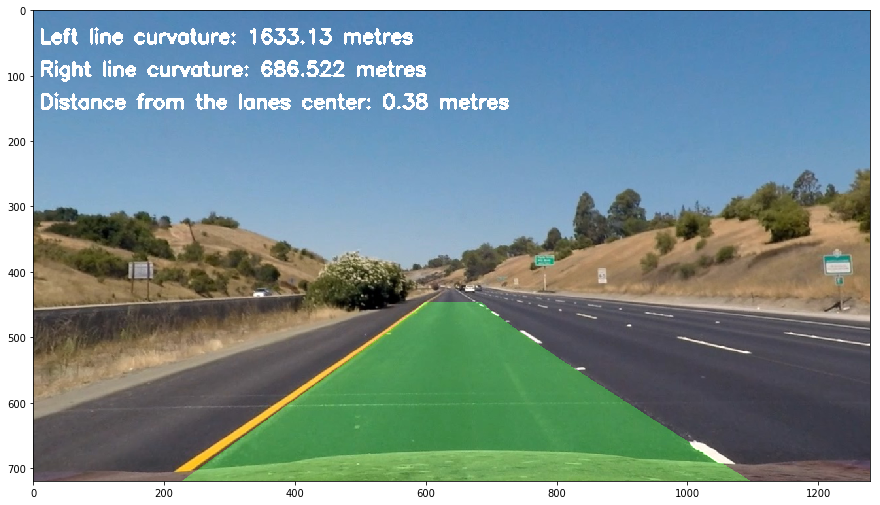

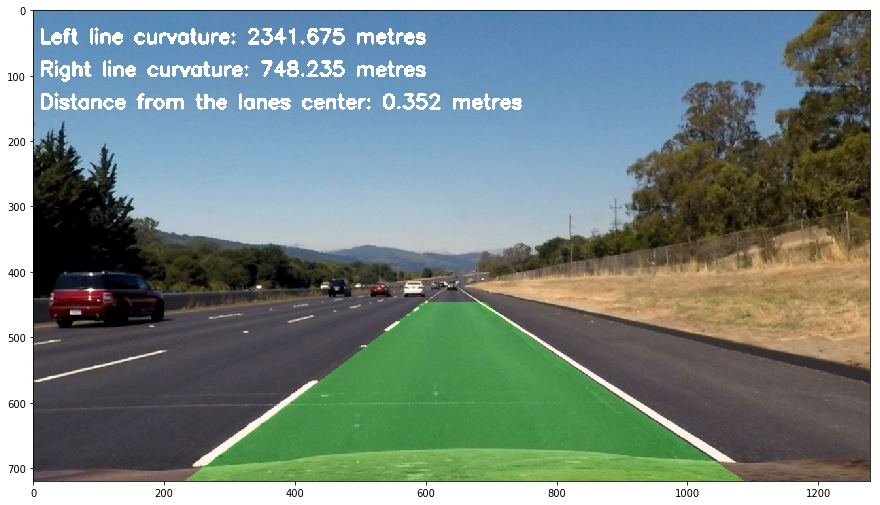

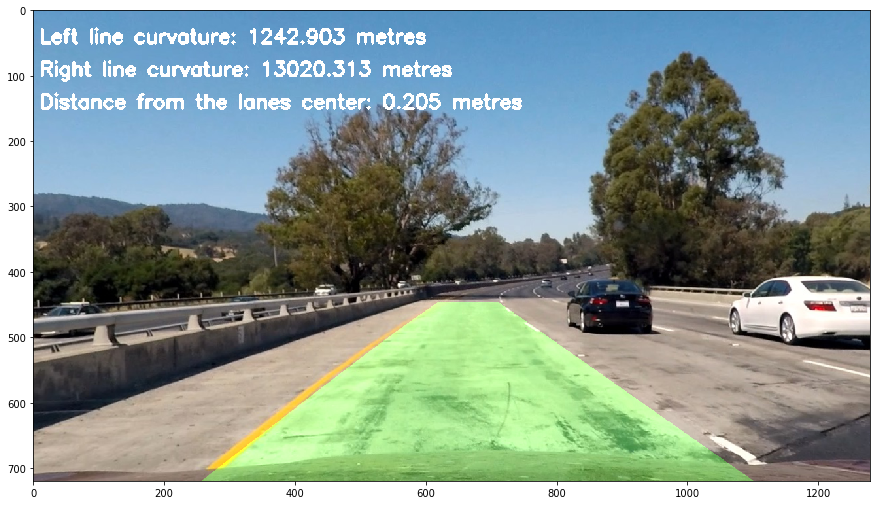

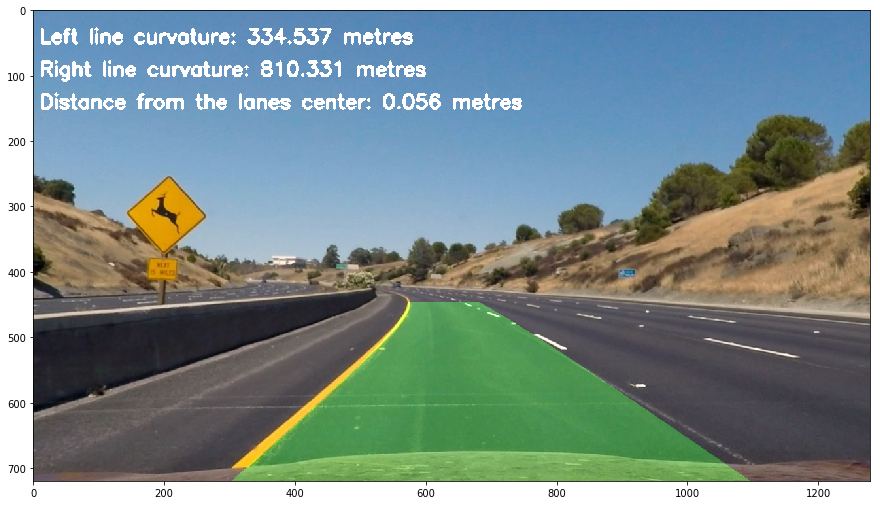

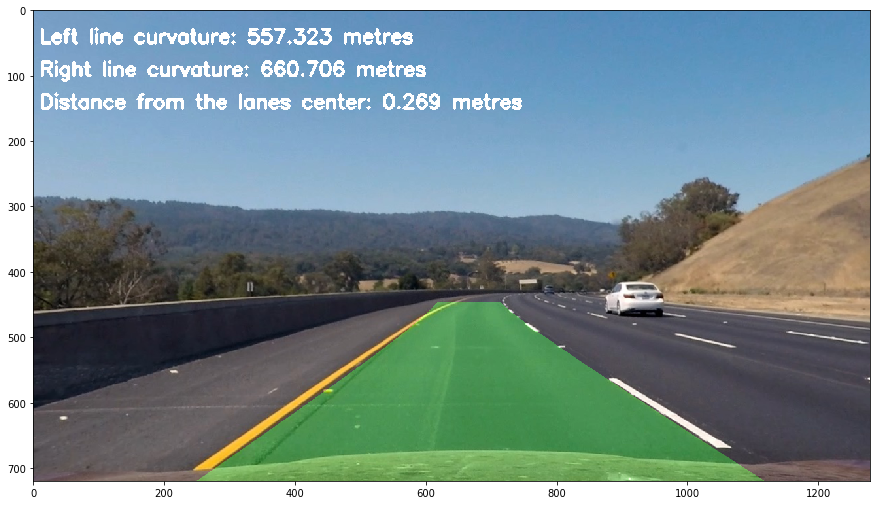

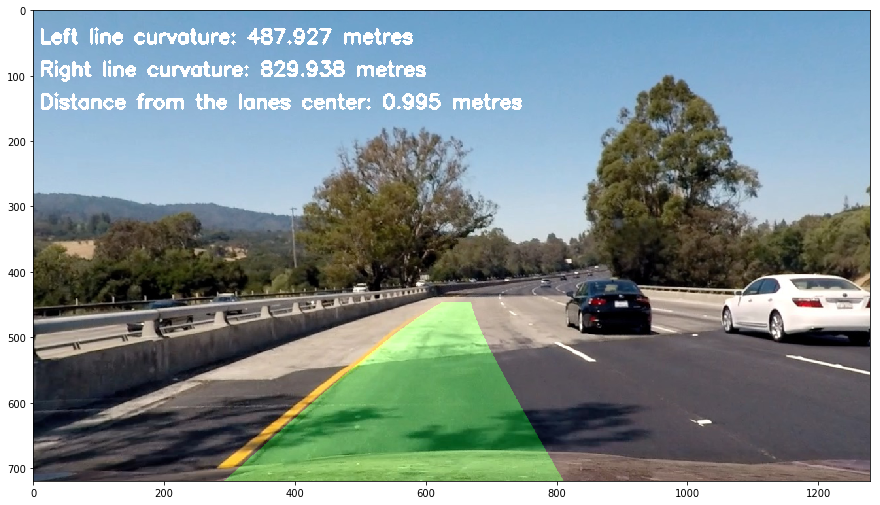

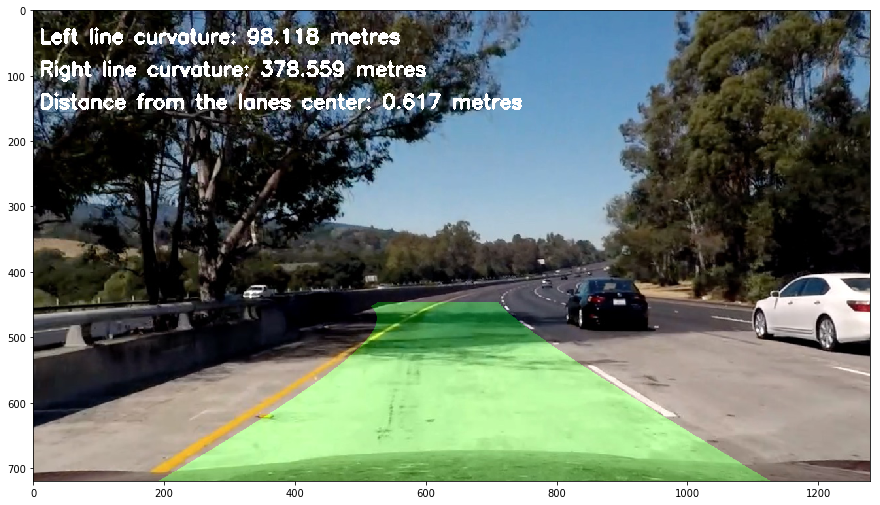

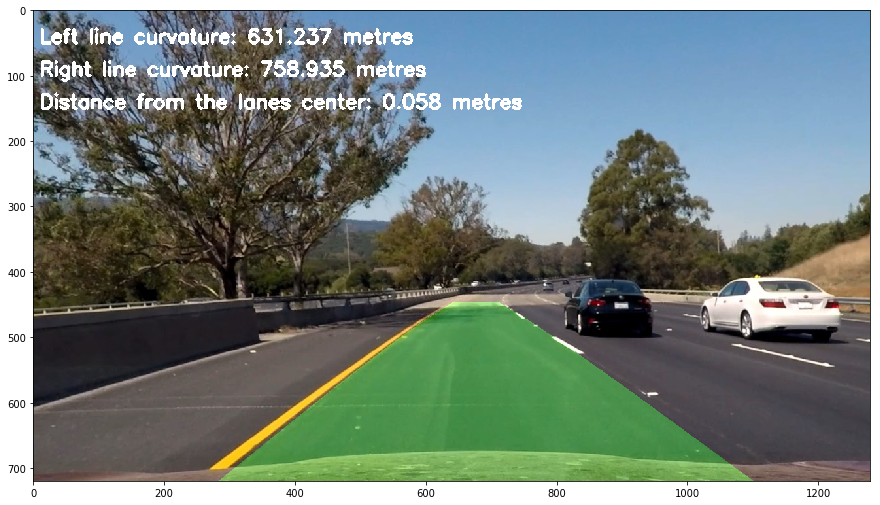

In [25]:
images = glob.glob('./test_images/*.jpg')
for fname in images:
    detector = LaneLineDetector()
    img = plt.imread(fname)
    plt.figure(figsize=(15,15))
    plt.imshow(detector.detect_lines(img))

In [26]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import os

In [27]:
if not os.path.exists("test_videos_output/"):
    os.makedirs("test_videos_output/")

In [28]:
detector = LaneLineDetector()
white_output = './test_videos_output/short_project_video.mp4'
clip1 = VideoFileClip("./short_project_video.mp4")
white_clip = clip1.fl_image(lambda img: detector.detect_lines(img))
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video ./test_videos_output/short_project_video.mp4
[MoviePy] Writing video ./test_videos_output/short_project_video.mp4


100%|█████████▉| 603/604 [02:03<00:00,  5.04it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./test_videos_output/short_project_video.mp4 

CPU times: user 2min 16s, sys: 28.8 s, total: 2min 45s
Wall time: 2min 4s


In [29]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [30]:
detector = LaneLineDetector()
white_output = './test_videos_output/project_video.mp4'
clip1 = VideoFileClip("./project_video.mp4")
white_clip = clip1.fl_image(lambda img: detector.detect_lines(img))
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video ./test_videos_output/project_video.mp4
[MoviePy] Writing video ./test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [04:22<00:00,  4.65it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./test_videos_output/project_video.mp4 

CPU times: user 4min 49s, sys: 1min 2s, total: 5min 51s
Wall time: 4min 23s


In [31]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

In [32]:
detector = LaneLineDetector()
white_output = './test_videos_output/challenge_video.mp4'
clip1 = VideoFileClip("./challenge_video.mp4")
white_clip = clip1.fl_image(lambda img: detector.detect_lines(img))
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video ./test_videos_output/challenge_video.mp4
[MoviePy] Writing video ./test_videos_output/challenge_video.mp4


100%|██████████| 485/485 [01:37<00:00,  4.18it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./test_videos_output/challenge_video.mp4 

CPU times: user 1min 51s, sys: 18 s, total: 2min 9s
Wall time: 1min 37s


In [33]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))